# Toxic Release Inventory

### Importing packages and loading data for EDA

In [2]:
import pandas as pd
import numpy as np

#### Importing csv of past 3 years i.e. 2019-2021

In [3]:
df = pd.read_csv('2021_us.csv')
df1 = pd.read_csv('2020_us.csv')
df2 = pd.read_csv('2019_us.csv')

C:\Users\janme\AppData\Local\Temp\ipykernel_4504\4259885177.py:1: DtypeWarning: Columns (15) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv('2021_us.csv')
C:\Users\janme\AppData\Local\Temp\ipykernel_4504\4259885177.py:3: DtypeWarning: Columns (15) have mixed types. Specify dtype option on import or set low_memory=False.
  df2 = pd.read_csv('2019_us.csv')


#### Checking the details information of the following TRI data.

In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 77272 entries, 0 to 77271
Columns: 119 entries, 1. YEAR to 119. 8.9 - PRODUCTION RATIO
dtypes: float64(86), int64(7), object(26)
memory usage: 70.2+ MB


In [5]:
df1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 78015 entries, 0 to 78014
Columns: 119 entries, 1. YEAR to 119. 8.9 - PRODUCTION RATIO
dtypes: float64(87), int64(5), object(27)
memory usage: 70.8+ MB


In [6]:
df2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 80411 entries, 0 to 80410
Columns: 119 entries, 1. YEAR to 119. 8.9 - PRODUCTION RATIO
dtypes: float64(87), int64(5), object(27)
memory usage: 73.0+ MB


#### Binning the Metal and chemical compounds using CAS# into 5 different classes of Metal Category 

In [7]:
data_int1 = {'CAS#': ['7440-36-0','N010','7440-38-2','N020','7440-41-7','N050','7440-43-9','N078',
                     '7440-47-3','N090','7440-48-4','N096','7440-50-8','N100','7439-92-1','N420',
                     '7439-96-5','N450','7439-97-6','N458','7440-02-0','N495','7782-49-2','N725',
                     '7440-22-4','N740','7440-28-0','N760','N770','N982']}

data_int2 = {'CAS#': ['1344-28-1', '20859-73-8', '1332-21-4','56-35-9','10294-34-5','7637-07-2',
                     '28407-37-6','16071-86-6', '13356-08-6','14484-64-1','13463-40-6','554-13-2',
                     '12427-38-2','9006-42-2','1313-27-5','20816-12-0', '7758-01-2','7632-00-0',
                     '1314-20-1','7550-45-0','1983-10-4','2155-70-6','639-58-7','76-87-9','12122-67-7']}

data_int3 = {'CAS#': ['7440-39-3', 'N040']}
data_int4 = {'CAS#': ['7429-90-5', '7440-62-2', '7440-66-6']}

df_int1 = pd.DataFrame(data_int1)
df_int2 = pd.DataFrame(data_int2)
df_int3 = pd.DataFrame(data_int3)
df_int4 = pd.DataFrame(data_int4)


# Define a function to assign categories based on CAS# values
def assign_category(cas_number):
    if cas_number in df_int1['CAS#']:
        return 1
    elif cas_number in df_int2['CAS#']:
        return 2
    elif cas_number in df_int3['CAS#']:
        return 3
    elif cas_number in df_int4['CAS#']:
        return 4
    else:
        return 0

# Create a new categorical column 'CATEGORY' based on 'CAS#'
df1['Metal Category1'] = df1['37. CAS#'].apply(assign_category).astype('category')

# Print the updated DataFrame
print(df1[['37. CAS#','Metal Category1']])

        37. CAS# Metal Category1
0      7440-02-0               0
1           N590               0
2       100-41-4               0
3       111-42-2               0
4        75-07-0               0
...          ...             ...
78010       N100               0
78011  7664-93-9               0
78012   115-07-1               0
78013    95-63-6               0
78014  7440-50-8               0

[78015 rows x 2 columns]


In [8]:
# Create a new categorical column 'CATEGORY' based on 'CAS#'
# Converting the metal category column from Int to category
df2['Metal Category1'] = df2['37. CAS#'].apply(assign_category).astype('category') 

print(df2[['37. CAS#','Metal Category1']])

        37. CAS# Metal Category1
0      7440-66-6               0
1        67-56-1               0
2           N078               0
3       191-24-2               0
4       108-95-2               0
...          ...             ...
80406  7783-06-4               0
80407    67-56-1               0
80408    67-56-1               0
80409  7440-02-0               0
80410       N458               0

[80411 rows x 2 columns]


In [9]:
df1['42. METAL CATEGORY'] = df1['Metal Category1']
df2['42. METAL CATEGORY'] = df2['Metal Category1']

In [10]:
df1 = df1.drop('Metal Category1', axis = 1)
df2 = df2.drop('Metal Category1', axis = 1)

#### Concatinating data from 2019-2021 into single dataframe

In [11]:
data = pd.concat([df, df1, df2], ignore_index = True)

In [12]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 235698 entries, 0 to 235697
Columns: 119 entries, 1. YEAR to 119. 8.9 - PRODUCTION RATIO
dtypes: float64(87), int64(6), object(26)
memory usage: 214.0+ MB


#### Checking information on different Facilities and Industry sector in the data.

In [13]:
df['20. INDUSTRY SECTOR'].nunique()

29

In [14]:
df['20. INDUSTRY SECTOR'].unique()

array(['Chemicals', 'Primary Metals', 'Plastics and Rubber', 'Machinery',
       'Paper', 'Food', 'Computers and Electronic Products',
       'Nonmetallic Mineral Product', 'Electric Utilities',
       'Transportation Equipment', 'Fabricated Metals', 'Wood Products',
       'Petroleum', 'Other', 'Petroleum Bulk Terminals',
       'Chemical Wholesalers', 'Electrical Equipment', 'Furniture',
       'Miscellaneous Manufacturing', 'Hazardous Waste', 'Beverages',
       'Metal Mining', 'Textiles', 'Printing', 'Coal Mining', 'Tobacco',
       'Textile Product', 'Leather', 'Publishing'], dtype=object)

In [15]:
data['20. INDUSTRY SECTOR'].value_counts().sum()

235698

In [16]:
df[['4. FACILITY NAME','20. INDUSTRY SECTOR']].value_counts()

4. FACILITY NAME                                        20. INDUSTRY SECTOR     
SHERWIN-WILLIAMS CO                                     Chemicals                   387
BASF CORP                                               Chemicals                   192
HERITAGE THERMAL SERVICES                               Hazardous Waste             189
CLEAN HARBORS EL DORADO LLC                             Hazardous Waste             186
VEOLIA ES TECHNICAL SOLUTIONS LLC PORT ARTHUR FACILITY  Hazardous Waste             178
                                                                                   ... 
FLEETWOOD HOMES OF VIRGINIA INC 19-2                    Wood Products                 1
PRUITT LUMBER CO INC.                                   Wood Products                 1
FLEURCHEM INC.                                          Chemicals                     1
FLEX-N-GATE DETROIT                                     Transportation Equipment      1
ZYKLUS HEAT TRANSFER                   

In [17]:
df['4. FACILITY NAME'].value_counts()

4. FACILITY NAME
SHERWIN-WILLIAMS CO                                       387
BASF CORP                                                 210
HERITAGE THERMAL SERVICES                                 189
CLEAN HARBORS EL DORADO LLC                               186
VEOLIA ES TECHNICAL SOLUTIONS LLC PORT ARTHUR FACILITY    178
                                                         ... 
JAMESTOWN ELECTRO PLATING WORKS INC                         1
TORAY COMPOSITE MATERIALS AMERICA                           1
GILES                                                       1
REACO BATTERY SERVICE                                       1
MARINE ELECTRICAL PRODUCTS                                  1
Name: count, Length: 18534, dtype: int64

In [18]:
data[data['43. CARCINOGEN']== 'YES']['34. CHEMICAL'].value_counts()

34. CHEMICAL
Lead                                        12107
Nickel                                       7594
Polycyclic aromatic compounds                4845
Ethylbenzene                                 4119
Naphthalene                                  3801
                                            ...  
N-Nitrosodimethylamine                          2
beta-Naphthylamine                              2
Methoxone sodium salt                           1
2,4-D propylene glycol butyl ether ester        1
Vinyl bromide                                   1
Name: count, Length: 176, dtype: int64

In [19]:
df['34. CHEMICAL'].value_counts()

34. CHEMICAL
Lead                              3915
Zinc compounds                    2950
Nickel                            2498
Chromium                          2463
Copper                            2375
                                  ... 
Methiocarb                           1
Alcohols, C8-14, γ-ω-perfluoro       1
Pronamide                            1
Diflubenzuron                        1
4,6-Dinitro-o-cresol                 1
Name: count, Length: 546, dtype: int64

In [20]:
df['112. 8.4 - RECYCLING ON SITE']

0        0.0
1        0.0
2        0.0
3        0.0
4        0.0
        ... 
77267    0.0
77268    0.0
77269    0.0
77270    0.0
77271    0.0
Name: 112. 8.4 - RECYCLING ON SITE, Length: 77272, dtype: float64

In [21]:
df[df['20. INDUSTRY SECTOR']== 'Chemicals']['4. FACILITY NAME'].value_counts()

4. FACILITY NAME
SHERWIN-WILLIAMS CO                                      387
BASF CORP                                                192
DOW CHEMICAL CO FREEPORT FACILITY                        103
WESTLAKE CHEMICALS & VINYLS LLC                           86
EQUISTAR CHEMICALS LP                                     75
                                                        ... 
SOULBRAIN MI                                               1
THORPE PLANT SERVICES                                      1
PIONEER AMERICAS LLC (DBA OLIN CHLOR ALKALI PRODUCTS)      1
WESCO HMB INC.                                             1
BAKER PAINT MANUFACTURING                                  1
Name: count, Length: 2900, dtype: int64

In [22]:
#data.to_csv('Appended_2019-2021.csv')

In [23]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 235698 entries, 0 to 235697
Columns: 119 entries, 1. YEAR to 119. 8.9 - PRODUCTION RATIO
dtypes: float64(87), int64(6), object(26)
memory usage: 214.0+ MB


In [24]:
data.columns

Index(['1. YEAR', '2. TRIFD', '3. FRS ID', '4. FACILITY NAME',
       '5. STREET ADDRESS', '6. CITY', '7. COUNTY', '8. ST', '9. ZIP',
       '10. BIA',
       ...
       '110. 8.2 - ENERGY RECOVER ON', '111. 8.3 - ENERGY RECOVER OF',
       '112. 8.4 - RECYCLING ON SITE', '113. 8.5 - RECYCLING OFF SIT',
       '114. 8.6 - TREATMENT ON SITE', '115. 8.7 - TREATMENT OFF SITE',
       '116. PRODUCTION WSTE (8.1-8.7)', '117. 8.8 - ONE-TIME RELEASE',
       '118. PROD_RATIO_OR_ ACTIVITY', '119. 8.9 - PRODUCTION RATIO'],
      dtype='object', length=119)

In [25]:
data.describe()

,1. YEAR,3. FRS ID,9. ZIP,10. BIA,12. LATITUDE,13. LONGITUDE,19. INDUSTRY SECTOR CODE,21. PRIMARY SIC,22. SIC 2,23. SIC 3,...,109. 8.1D - OFF-SITE OTHER R,110. 8.2 - ENERGY RECOVER ON,111. 8.3 - ENERGY RECOVER OF,112. 8.4 - RECYCLING ON SITE,113. 8.5 - RECYCLING OFF SIT,114. 8.6 - TREATMENT ON SITE,115. 8.7 - TREATMENT OFF SITE,116. PRODUCTION WSTE (8.1-8.7),117. 8.8 - ONE-TIME RELEASE,119. 8.9 - PRODUCTION RATIO
count,235698.000000,2.356840e+05,2.356980e+05,868.000000,235684.000000,235684.000000,235698.000000,4.0,0.0,0.0,...,2.356980e+05,2.356980e+05,2.356980e+05,2.356980e+05,2.356980e+05,2.356980e+05,2.356980e+05,2.356980e+05,2.377800e+04,2.214940e+05
mean,2019.986682,1.100174e+11,7.244639e+06,610.531106,37.684886,-90.676812,776.024480,2865.0,NaN,NaN,...,1.923676e+03,3.137166e+04,5.900980e+03,1.661135e+05,2.821102e+04,9.419300e+04,7.004396e+03,3.743871e+05,2.257034e+03,2.755459e+01
std,0.817820,2.331213e+07,7.099383e+07,326.752001,5.444676,14.935302,1124.246813,0.0,NaN,NaN,...,4.212550e+04,7.300976e+05,1.653078e+05,1.531991e+07,4.322862e+05,2.165315e+06,1.992558e+05,1.562595e+07,1.559219e+05,6.612058e+03
min,2019.000000,1.100003e+11,6.030000e+02,1.000000,-14.270919,-170.687692,311.000000,2865.0,NaN,NaN,...,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00
25%,2019.000000,1.100005e+11,3.361000e+04,124.000000,33.773273,-95.320500,325.000000,2865.0,NaN,NaN,...,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,1.370000e+01,0.000000e+00,8.200000e-01
50%,2020.000000,1.100021e+11,5.045600e+04,780.000000,38.678590,-88.058333,331.000000,2865.0,NaN,NaN,...,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,3.138779e+03,0.000000e+00,1.000000e+00
75%,2021.000000,1.100329e+11,7.463100e+04,906.000000,41.583150,-82.177900,336.000000,2865.0,NaN,NaN,...,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,3.801171e+04,0.000000e+00,1.090000e+00
max,2021.000000,1.100714e+11,9.970345e+08,908.000000,70.233946,145.749933,4247.000000,2865.0,NaN,NaN,...,6.102260e+06,7.015460e+07,3.963904e+07,3.623270e+09,8.111962e+07,5.182191e+08,4.922355e+07,3.623825e+09,2.318599e+07,2.601000e+06


#### Removing impurities from the column names

In [26]:
# Removing numerical values i.e. in the beginning of the columns names
data.columns = [col.split('. ', 1)[1] if col.startswith(('0', '1', '2', '3', '4', '5', '6', '7', '8', '9')) 
              else col for col in data.columns]

In [27]:
data.columns

Index(['YEAR', 'TRIFD', 'FRS ID', 'FACILITY NAME', 'STREET ADDRESS', 'CITY',
       'COUNTY', 'ST', 'ZIP', 'BIA',
       ...
       '8.2 - ENERGY RECOVER ON', '8.3 - ENERGY RECOVER OF',
       '8.4 - RECYCLING ON SITE', '8.5 - RECYCLING OFF SIT',
       '8.6 - TREATMENT ON SITE', '8.7 - TREATMENT OFF SITE',
       'PRODUCTION WSTE (8.1-8.7)', '8.8 - ONE-TIME RELEASE',
       'PROD_RATIO_OR_ ACTIVITY', '8.9 - PRODUCTION RATIO'],
      dtype='object', length=119)

#### Plotting a Correlation matrix to check multicollinearity in the data.
**1. Removing columns that causes the multicollinearity**

**2. Removing columns that has more than 90% of values as zeros**

**3. Removing columns that has least importance for analysis**

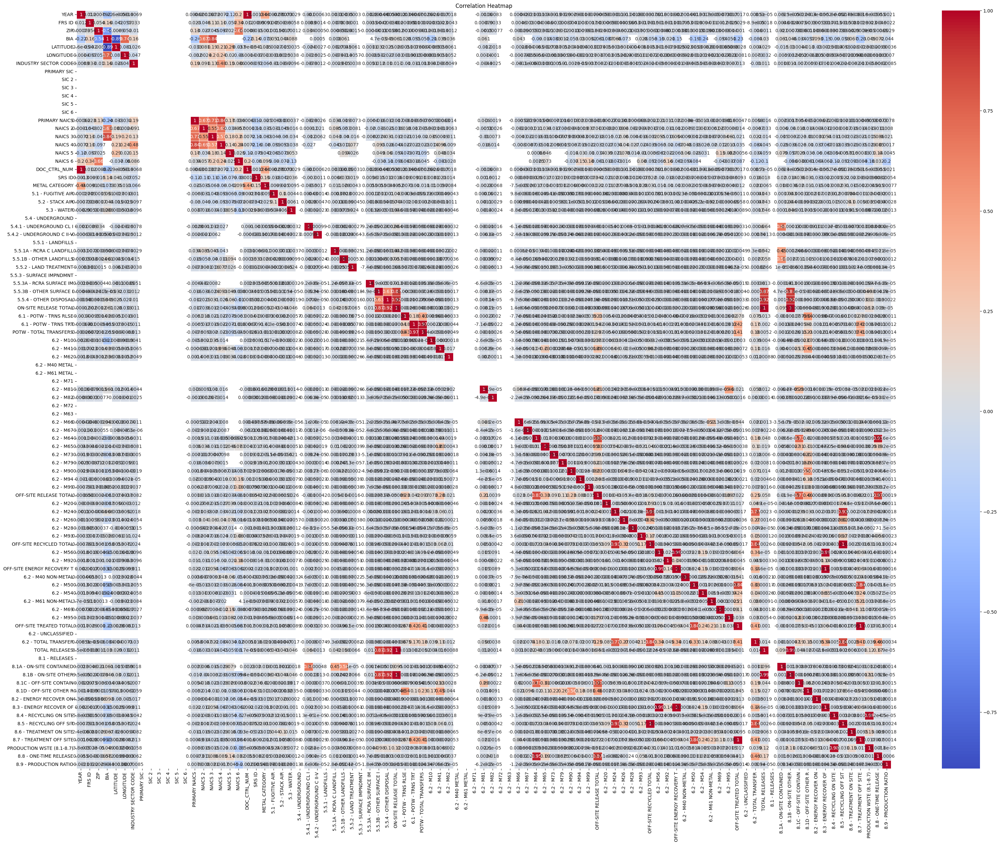

In [28]:
import matplotlib.pyplot as plt
import seaborn as sns

correlation_matrix = data.corr(numeric_only = True)

filtered_correlation = correlation_matrix[
    (correlation_matrix >= 0.2) | (correlation_matrix <= -0.2)]

plt.figure(figsize=(40, 30))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', linewidths=0.5)
plt.title('Correlation Heatmap')
plt.show()

In [29]:
subset = data[['PRIMARY SIC', 'SIC 2', 'SIC 3','SIC 4', 'SIC 5','SIC 6','5.4 - UNDERGROUND','5.5.1 - LANDFILLS',
            '5.5.3 - SURFACE IMPNDMNT','6.2 - M40 METAL','6.2 - M61 METAL','6.2 - M71', '6.2 - M72', '6.2 - M63',
            '6.2 - UNCLASSIFIED','8.1 - RELEASES']]

subset.describe()

,PRIMARY SIC,SIC 2,SIC 3,SIC 4,SIC 5,SIC 6,5.4 - UNDERGROUND,5.5.1 - LANDFILLS,5.5.3 - SURFACE IMPNDMNT,6.2 - M40 METAL,6.2 - M61 METAL,6.2 - M71,6.2 - M72,6.2 - M63,6.2 - UNCLASSIFIED,8.1 - RELEASES
count,4.0,0.0,0.0,0.0,0.0,0.0,235698.0,235698.0,235698.0,235698.0,235698.0,235698.0,235698.0,235698.0,235698.0,235698.0
mean,2865.0,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
std,0.0,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
min,2865.0,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
25%,2865.0,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
50%,2865.0,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
75%,2865.0,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
max,2865.0,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [30]:
columns_with_na = data.columns[data.isna().any()].tolist()

print("Columns with NaN values:", columns_with_na)

for column in columns_with_na:
    empty_rows_count = data[column].isna().sum()
    print(f"Number of empty rows in '{column}': {empty_rows_count}")

Columns with NaN values: ['FRS ID', 'BIA', 'TRIBE', 'LATITUDE', 'LONGITUDE', 'HORIZONTAL DATUM', 'PARENT CO NAME', 'PARENT CO DB NUM', 'STANDARD PARENT CO NAME', 'PRIMARY SIC', 'SIC 2', 'SIC 3', 'SIC 4', 'SIC 5', 'SIC 6', 'NAICS 2', 'NAICS 3', 'NAICS 4', 'NAICS 5', 'NAICS 6', 'SRS ID', '8.8 - ONE-TIME RELEASE', 'PROD_RATIO_OR_ ACTIVITY', '8.9 - PRODUCTION RATIO']
Number of empty rows in 'FRS ID': 14
Number of empty rows in 'BIA': 234830
Number of empty rows in 'TRIBE': 234830
Number of empty rows in 'LATITUDE': 14
Number of empty rows in 'LONGITUDE': 14
Number of empty rows in 'HORIZONTAL DATUM': 14
Number of empty rows in 'PARENT CO NAME': 43464
Number of empty rows in 'PARENT CO DB NUM': 72901
Number of empty rows in 'STANDARD PARENT CO NAME': 66589
Number of empty rows in 'PRIMARY SIC': 235694
Number of empty rows in 'SIC 2': 235698
Number of empty rows in 'SIC 3': 235698
Number of empty rows in 'SIC 4': 235698
Number of empty rows in 'SIC 5': 235698
Number of empty rows in 'SIC 6':

In [31]:
data['CAS#']

0          111-42-2
1         7440-47-3
2         7429-90-5
3              N120
4              N120
            ...    
235693    7783-06-4
235694      67-56-1
235695      67-56-1
235696    7440-02-0
235697         N458
Name: CAS#, Length: 235698, dtype: object

In [32]:
data['TRI CHEMICAL/COMPOUND ID']

0         0000111422
1         0007440473
2         0007429905
3               N120
4               N120
             ...    
235693    0007783064
235694    0000067561
235695    0000067561
235696    0007440020
235697          N458
Name: TRI CHEMICAL/COMPOUND ID, Length: 235698, dtype: object

In [33]:
#df[(df['METAL CATEGORY']==1)&(df['YEAR'==2019])]['CHEMICAL'].value_counts()
data[(data['YEAR'] == 2021) & (data['METAL'] == 'NO')]['METAL CATEGORY'].value_counts()

#print(value_counts)

METAL CATEGORY
0    45928
2      756
3      703
4      578
Name: count, dtype: int64

In [34]:
data['METAL CATEGORY']

0         0
1         1
2         4
3         0
4         0
         ..
235693    0
235694    0
235695    0
235696    0
235697    0
Name: METAL CATEGORY, Length: 235698, dtype: int64

In [35]:
data['8.8 - ONE-TIME RELEASE'].value_counts()

8.8 - ONE-TIME RELEASE
0.000000       19364
1.000000         236
2.000000         129
3.000000          86
5.000000          84
               ...  
903.000000         1
232.757000         1
2066.000000        1
0.000008           1
0.008956           1
Name: count, Length: 2245, dtype: int64

In [36]:
df2['42. METAL CATEGORY']

0        0
1        0
2        0
3        0
4        0
        ..
80406    0
80407    0
80408    0
80409    0
80410    0
Name: 42. METAL CATEGORY, Length: 80411, dtype: category
Categories (1, int64): [0]

In [37]:
data['METAL CATEGORY'].value_counts()

METAL CATEGORY
0    204354
1     29307
2       756
3       703
4       578
Name: count, dtype: int64

In [38]:
data['METAL'].value_counts()

METAL
NO     146282
YES     89416
Name: count, dtype: int64

In [39]:
#data.to_csv('TRI_appended.csv')

In [40]:
data = data.drop(columns = ['BIA','TRIBE','PRIMARY SIC','SIC 2','SIC 3','SIC 4','SIC 5','SIC 6'
                       ,'NAICS 2','NAICS 3','NAICS 4','NAICS 5','NAICS 6','5.4 - UNDERGROUND',
                       '5.5.1 - LANDFILLS','5.5.3 - SURFACE IMPNDMNT','6.2 - M40 METAL','6.2 - M61 METAL',
                        '6.2 - M71', '6.2 - M72', '6.2 - M63','6.2 - UNCLASSIFIED','8.1 - RELEASES'])

In [41]:
data.columns

Index(['YEAR', 'TRIFD', 'FRS ID', 'FACILITY NAME', 'STREET ADDRESS', 'CITY',
       'COUNTY', 'ST', 'ZIP', 'LATITUDE', 'LONGITUDE', 'HORIZONTAL DATUM',
       'PARENT CO NAME', 'PARENT CO DB NUM', 'STANDARD PARENT CO NAME',
       'FEDERAL FACILITY', 'INDUSTRY SECTOR CODE', 'INDUSTRY SECTOR',
       'PRIMARY NAICS', 'DOC_CTRL_NUM', 'CHEMICAL', 'ELEMENTAL METAL INCLUDED',
       'TRI CHEMICAL/COMPOUND ID', 'CAS#', 'SRS ID', 'CLEAN AIR ACT CHEMICAL',
       'CLASSIFICATION', 'METAL', 'METAL CATEGORY', 'CARCINOGEN', 'PBT',
       'PFAS', 'FORM TYPE', 'UNIT OF MEASURE', '5.1 - FUGITIVE AIR',
       '5.2 - STACK AIR', '5.3 - WATER', '5.4.1 - UNDERGROUND CL I',
       '5.4.2 - UNDERGROUND C II-V', '5.5.1A - RCRA C LANDFILL',
       '5.5.1B - OTHER LANDFILLS', '5.5.2 - LAND TREATMENT',
       '5.5.3A - RCRA SURFACE IM', '5.5.3B - OTHER SURFACE I',
       '5.5.4 - OTHER DISPOSAL', 'ON-SITE RELEASE TOTAL',
       '6.1 - POTW - TRNS RLSE', '6.1 - POTW - TRNS TRT',
       'POTW - TOTAL TRANSFERS'

In [42]:
columns_with_na = data.columns[data.isna().any()].tolist()

print("Columns with NaN values:", columns_with_na)

for column in columns_with_na:
    empty_rows_count = data[column].isna().sum()
    print(f"Number of empty rows in '{column}': {empty_rows_count}")

Columns with NaN values: ['FRS ID', 'LATITUDE', 'LONGITUDE', 'HORIZONTAL DATUM', 'PARENT CO NAME', 'PARENT CO DB NUM', 'STANDARD PARENT CO NAME', 'SRS ID', '8.8 - ONE-TIME RELEASE', 'PROD_RATIO_OR_ ACTIVITY', '8.9 - PRODUCTION RATIO']
Number of empty rows in 'FRS ID': 14
Number of empty rows in 'LATITUDE': 14
Number of empty rows in 'LONGITUDE': 14
Number of empty rows in 'HORIZONTAL DATUM': 14
Number of empty rows in 'PARENT CO NAME': 43464
Number of empty rows in 'PARENT CO DB NUM': 72901
Number of empty rows in 'STANDARD PARENT CO NAME': 66589
Number of empty rows in 'SRS ID': 222
Number of empty rows in '8.8 - ONE-TIME RELEASE': 211920
Number of empty rows in 'PROD_RATIO_OR_ ACTIVITY': 31666
Number of empty rows in '8.9 - PRODUCTION RATIO': 14204


In [43]:
data = data.drop(columns = ['FRS ID', 'LATITUDE', 'LONGITUDE', 'HORIZONTAL DATUM', 'PARENT CO NAME',
                            'PARENT CO DB NUM', 'STANDARD PARENT CO NAME', 'SRS ID'])

In [44]:
columns_with_na = data.columns[data.isna().any()].tolist()

print("Columns with NaN values:", columns_with_na)

for column in columns_with_na:
    empty_rows_count = data[column].isna().sum()
    print(f"Number of empty rows in '{column}': {empty_rows_count}")

Columns with NaN values: ['8.8 - ONE-TIME RELEASE', 'PROD_RATIO_OR_ ACTIVITY', '8.9 - PRODUCTION RATIO']
Number of empty rows in '8.8 - ONE-TIME RELEASE': 211920
Number of empty rows in 'PROD_RATIO_OR_ ACTIVITY': 31666
Number of empty rows in '8.9 - PRODUCTION RATIO': 14204


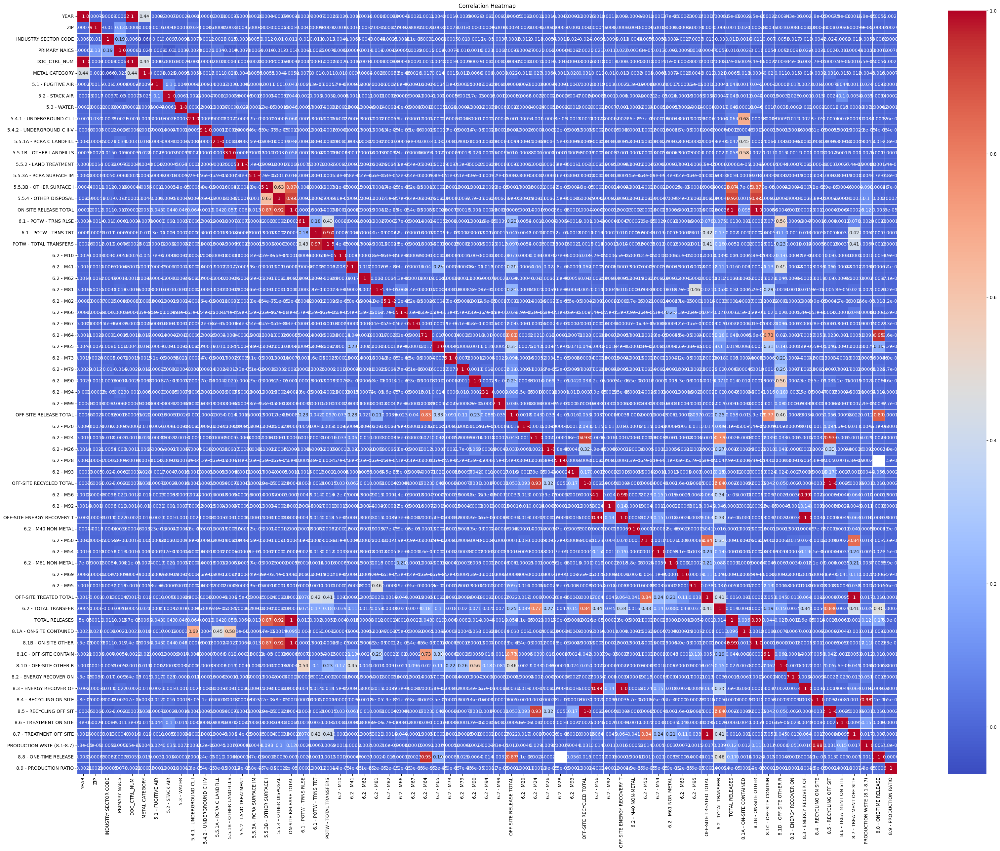

In [45]:
import matplotlib.pyplot as plt
import seaborn as sns

correlation_matrix = data.corr(numeric_only = True)

"""filtered_correlation = correlation_matrix[
    (correlation_matrix >= 0.2) | (correlation_matrix <= -0.2)]"""

plt.figure(figsize=(40, 30))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', linewidths=0.5)
plt.title('Correlation Heatmap')
plt.show()

In [46]:
data['METAL CATEGORY'].value_counts()

METAL CATEGORY
0    204354
1     29307
2       756
3       703
4       578
Name: count, dtype: int64

In [47]:
columns_with_na = data.columns[data.isna().any()].tolist()

print("Columns with NaN values:", columns_with_na)

for column in columns_with_na:
    empty_rows_count = data[column].isna().sum()
    print(f"Number of empty rows in '{column}': {empty_rows_count}")

Columns with NaN values: ['8.8 - ONE-TIME RELEASE', 'PROD_RATIO_OR_ ACTIVITY', '8.9 - PRODUCTION RATIO']
Number of empty rows in '8.8 - ONE-TIME RELEASE': 211920
Number of empty rows in 'PROD_RATIO_OR_ ACTIVITY': 31666
Number of empty rows in '8.9 - PRODUCTION RATIO': 14204


In [48]:
correlation_matrix = data.corr(numeric_only = True)

columns_to_remove = set()

for i in range(len(correlation_matrix.columns)):
    for j in range(i):
        if abs(correlation_matrix.iloc[i,j]) >= 0.75:
            col_i = correlation_matrix.columns[i]
            col_j = correlation_matrix.columns[j]
            column_to_remove = min(col_i, col_j)
            columns_to_remove.add(column_to_remove)

print('Columns to eliminate due to Multicollinearity:', columns_to_remove)

Columns to eliminate due to Multicollinearity: {'8.8 - ONE-TIME RELEASE', '6.2 - M24', '8.1B - ON-SITE OTHER', '6.2 - M56', '5.5.4 - OTHER DISPOSAL', '8.1C - OFF-SITE CONTAIN', '8.5 - RECYCLING OFF SIT', '5.5.3B - OTHER SURFACE I', '6.2 - M50', '6.1 - POTW - TRNS TRT', '8.3 - ENERGY RECOVER OF', '8.7 - TREATMENT OFF SITE', '6.2 - TOTAL TRANSFER', 'ON-SITE RELEASE TOTAL', 'DOC_CTRL_NUM', '8.4 - RECYCLING ON SITE', '6.2 - M64'}


In [49]:
columns_to_remove = ['6.2 - M24', '8.4 - RECYCLING ON SITE', '6.2 - M56', '6.1 - POTW - TRNS TRT', '8.3 - ENERGY RECOVER OF', 
                     '6.2 - M50', '5.5.4 - OTHER DISPOSAL', '6.2 - M64', 'ON-SITE RELEASE TOTAL', '8.8 - ONE-TIME RELEASE',
                     '5.5.3B - OTHER SURFACE I', '8.5 - RECYCLING OFF SIT','6.2 - TOTAL TRANSFER', '8.7 - TREATMENT OFF SITE',
                     'DOC_CTRL_NUM', '8.1C - OFF-SITE CONTAIN', '8.1B - ON-SITE OTHER']
data_no_correlated = data.drop(columns= columns_to_remove)

data_no_correlated.columns

Index(['YEAR', 'TRIFD', 'FACILITY NAME', 'STREET ADDRESS', 'CITY', 'COUNTY',
       'ST', 'ZIP', 'FEDERAL FACILITY', 'INDUSTRY SECTOR CODE',
       'INDUSTRY SECTOR', 'PRIMARY NAICS', 'CHEMICAL',
       'ELEMENTAL METAL INCLUDED', 'TRI CHEMICAL/COMPOUND ID', 'CAS#',
       'CLEAN AIR ACT CHEMICAL', 'CLASSIFICATION', 'METAL', 'METAL CATEGORY',
       'CARCINOGEN', 'PBT', 'PFAS', 'FORM TYPE', 'UNIT OF MEASURE',
       '5.1 - FUGITIVE AIR', '5.2 - STACK AIR', '5.3 - WATER',
       '5.4.1 - UNDERGROUND CL I', '5.4.2 - UNDERGROUND C II-V',
       '5.5.1A - RCRA C LANDFILL', '5.5.1B - OTHER LANDFILLS',
       '5.5.2 - LAND TREATMENT', '5.5.3A - RCRA SURFACE IM',
       '6.1 - POTW - TRNS RLSE', 'POTW - TOTAL TRANSFERS', '6.2 - M10',
       '6.2 - M41', '6.2 - M62', '6.2 - M81', '6.2 - M82', '6.2 - M66',
       '6.2 - M67', '6.2 - M65', '6.2 - M73', '6.2 - M79', '6.2 - M90',
       '6.2 - M94', '6.2 - M99', 'OFF-SITE RELEASE TOTAL', '6.2 - M20',
       '6.2 - M26', '6.2 - M28', '6.2 - M93', '

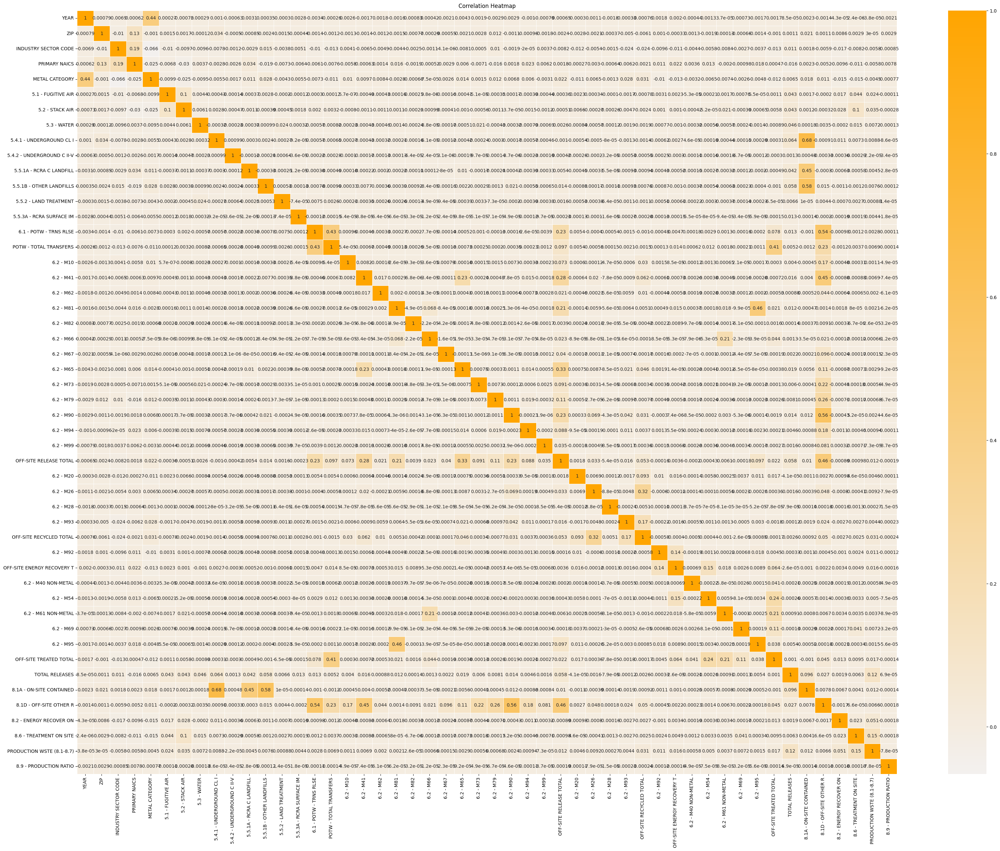

In [50]:
correlation_matrix = data_no_correlated.corr(numeric_only = True)

plt.figure(figsize=(40, 30))
sns.heatmap(correlation_matrix, annot=True,cmap = sns.color_palette("light:orange", as_cmap=True),linewidths=0.5)
plt.title('Correlation Heatmap')
plt.show()

#### Impution of  NA values 

**As we are done with removing columns unnecessary columns from the data. Now, we are going to removing NA values with required imputation**

In [51]:
columns_with_na = data_no_correlated.columns[data_no_correlated.isna().any()].tolist()

print("Columns with NaN values:", columns_with_na)

for column in columns_with_na:
    empty_rows_count = data_no_correlated[column].isna().sum()
    print(f"Number of empty rows in '{column}': {empty_rows_count}")

Columns with NaN values: ['PROD_RATIO_OR_ ACTIVITY', '8.9 - PRODUCTION RATIO']
Number of empty rows in 'PROD_RATIO_OR_ ACTIVITY': 31666
Number of empty rows in '8.9 - PRODUCTION RATIO': 14204


In [52]:
data_no_correlated['PROD_RATIO_OR_ ACTIVITY'].value_counts()

PROD_RATIO_OR_ ACTIVITY
PRODUCTION    171421
ACTIVITY       32611
Name: count, dtype: int64

In [53]:
data_no_correlated['PROD_RATIO_OR_ ACTIVITY'].head()

0           NaN
1    PRODUCTION
2    PRODUCTION
3      ACTIVITY
4           NaN
Name: PROD_RATIO_OR_ ACTIVITY, dtype: object

In [54]:
data_no_correlated.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 235698 entries, 0 to 235697
Data columns (total 71 columns):
 #   Column                      Non-Null Count   Dtype  
---  ------                      --------------   -----  
 0   YEAR                        235698 non-null  int64  
 1   TRIFD                       235698 non-null  object 
 2   FACILITY NAME               235698 non-null  object 
 3   STREET ADDRESS              235698 non-null  object 
 4   CITY                        235698 non-null  object 
 5   COUNTY                      235698 non-null  object 
 6   ST                          235698 non-null  object 
 7   ZIP                         235698 non-null  int64  
 8   FEDERAL FACILITY            235698 non-null  object 
 9   INDUSTRY SECTOR CODE        235698 non-null  int64  
 10  INDUSTRY SECTOR             235698 non-null  object 
 11  PRIMARY NAICS               235698 non-null  int64  
 12  CHEMICAL                    235698 non-null  object 
 13  ELEMENTAL META

In [55]:
data_no_correlated.columns

Index(['YEAR', 'TRIFD', 'FACILITY NAME', 'STREET ADDRESS', 'CITY', 'COUNTY',
       'ST', 'ZIP', 'FEDERAL FACILITY', 'INDUSTRY SECTOR CODE',
       'INDUSTRY SECTOR', 'PRIMARY NAICS', 'CHEMICAL',
       'ELEMENTAL METAL INCLUDED', 'TRI CHEMICAL/COMPOUND ID', 'CAS#',
       'CLEAN AIR ACT CHEMICAL', 'CLASSIFICATION', 'METAL', 'METAL CATEGORY',
       'CARCINOGEN', 'PBT', 'PFAS', 'FORM TYPE', 'UNIT OF MEASURE',
       '5.1 - FUGITIVE AIR', '5.2 - STACK AIR', '5.3 - WATER',
       '5.4.1 - UNDERGROUND CL I', '5.4.2 - UNDERGROUND C II-V',
       '5.5.1A - RCRA C LANDFILL', '5.5.1B - OTHER LANDFILLS',
       '5.5.2 - LAND TREATMENT', '5.5.3A - RCRA SURFACE IM',
       '6.1 - POTW - TRNS RLSE', 'POTW - TOTAL TRANSFERS', '6.2 - M10',
       '6.2 - M41', '6.2 - M62', '6.2 - M81', '6.2 - M82', '6.2 - M66',
       '6.2 - M67', '6.2 - M65', '6.2 - M73', '6.2 - M79', '6.2 - M90',
       '6.2 - M94', '6.2 - M99', 'OFF-SITE RELEASE TOTAL', '6.2 - M20',
       '6.2 - M26', '6.2 - M28', '6.2 - M93', '

**We are imputing values using mode for the following column.**

In [56]:
mode_values = data_no_correlated['PROD_RATIO_OR_ ACTIVITY'].mode()[0]
data_no_correlated['PROD_RATIO_OR_ ACTIVITY'] = data_no_correlated['PROD_RATIO_OR_ ACTIVITY'].fillna(mode_values)

#### Removing columns which can uniquely identify each rows.

In [57]:
data_no_correlated = data_no_correlated.drop(columns = ['YEAR','TRIFD', 'FACILITY NAME', 'STREET ADDRESS', 'CITY', 'COUNTY',
       'ST', 'ZIP','INDUSTRY SECTOR CODE','PRIMARY NAICS', 'CHEMICAL', 'CAS#'])

In [58]:
data_no_correlated = data_no_correlated.drop('TRI CHEMICAL/COMPOUND ID', axis=1)

#### We are targeting only Chemical industry for our analysis here.

In [59]:
data_no_correlated = data_no_correlated[data_no_correlated['INDUSTRY SECTOR']== 'Chemicals']
data_no_correlated.head(10)

,FEDERAL FACILITY,INDUSTRY SECTOR,ELEMENTAL METAL INCLUDED,CLEAN AIR ACT CHEMICAL,CLASSIFICATION,METAL,METAL CATEGORY,CARCINOGEN,PBT,PFAS,...,6.2 - M95,OFF-SITE TREATED TOTAL,TOTAL RELEASES,8.1A - ON-SITE CONTAINED,8.1D - OFF-SITE OTHER R,8.2 - ENERGY RECOVER ON,8.6 - TREATMENT ON SITE,PRODUCTION WSTE (8.1-8.7),PROD_RATIO_OR_ ACTIVITY,8.9 - PRODUCTION RATIO
0,NO,Chemicals,NO,YES,TRI,NO,0,NO,NO,NO,...,0.0,0.0,0.00,0.0,0.0,0.0,0.0,0.00,PRODUCTION,0.00
6,NO,Chemicals,NO,YES,TRI,NO,0,NO,NO,NO,...,0.0,0.0,11211.00,0.0,0.0,38801.0,41132.0,105955.00,ACTIVITY,1.19
7,NO,Chemicals,NO,YES,TRI,NO,0,NO,NO,NO,...,0.0,0.0,255.00,0.0,0.0,0.0,82496.0,82751.00,PRODUCTION,2.10
9,NO,Chemicals,NO,YES,TRI,NO,0,YES,NO,NO,...,0.0,171.0,7969.00,0.0,0.0,0.0,2672.0,10812.00,PRODUCTION,1.17
32,NO,Chemicals,NO,YES,TRI,NO,0,NO,NO,NO,...,0.0,0.0,674.00,0.0,0.0,0.0,0.0,674.00,PRODUCTION,0.65
33,NO,Chemicals,NO,NO,TRI,NO,0,NO,NO,NO,...,0.0,0.0,0.00,0.0,0.0,0.0,0.0,0.00,PRODUCTION,0.00
34,NO,Chemicals,NO,YES,TRI,YES,1,NO,NO,NO,...,0.0,0.0,0.00,0.0,0.0,0.0,0.0,0.00,PRODUCTION,0.00
42,NO,Chemicals,NO,YES,TRI,NO,0,NO,NO,NO,...,0.0,0.0,0.00,0.0,0.0,0.0,0.0,0.00,PRODUCTION,1.00
46,NO,Chemicals,NO,NO,TRI,YES,1,NO,NO,NO,...,0.0,0.0,15689.96,0.0,15689.0,0.0,0.0,15689.96,PRODUCTION,0.96
50,NO,Chemicals,NO,YES,TRI,NO,0,NO,NO,NO,...,0.0,3408.6,1336.40,0.0,296.4,0.0,0.0,68320.00,PRODUCTION,0.83


In [60]:
data_no_correlated.describe()

,METAL CATEGORY,5.1 - FUGITIVE AIR,5.2 - STACK AIR,5.3 - WATER,5.4.1 - UNDERGROUND CL I,5.4.2 - UNDERGROUND C II-V,5.5.1A - RCRA C LANDFILL,5.5.1B - OTHER LANDFILLS,5.5.2 - LAND TREATMENT,5.5.3A - RCRA SURFACE IM,...,6.2 - M69,6.2 - M95,OFF-SITE TREATED TOTAL,TOTAL RELEASES,8.1A - ON-SITE CONTAINED,8.1D - OFF-SITE OTHER R,8.2 - ENERGY RECOVER ON,8.6 - TREATMENT ON SITE,PRODUCTION WSTE (8.1-8.7),8.9 - PRODUCTION RATIO
count,55146.000000,5.514600e+04,5.514600e+04,5.514600e+04,5.514600e+04,55146.000000,5.514600e+04,5.514600e+04,55146.000000,55146.000000,...,5.514600e+04,5.514600e+04,5.514600e+04,5.514600e+04,5.514600e+04,5.514600e+04,5.514600e+04,5.514600e+04,5.514600e+04,5.111400e+04
mean,0.064030,3.178858e+03,5.994839e+03,1.383869e+03,9.105067e+03,56.364468,8.555330e+01,2.078626e+03,23.134701,0.055215,...,2.884176e+02,1.763083e+02,1.805627e+04,2.792424e+04,1.126869e+04,1.821098e+03,6.320347e+04,2.088561e+05,8.942871e+05,4.013248e+01
std,0.316067,1.285659e+05,1.012449e+05,2.833869e+04,2.241310e+05,4529.261652,1.358511e+04,1.306178e+05,1632.599938,9.717509,...,1.186324e+04,9.240260e+03,3.707180e+05,3.431267e+05,2.602111e+05,3.834313e+04,9.241509e+05,4.000367e+06,3.075722e+07,6.829429e+03
min,0.000000,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000,0.000000e+00,0.000000e+00,0.000000,0.000000,...,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00
25%,0.000000,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000,0.000000e+00,0.000000e+00,0.000000,0.000000,...,0.000000e+00,0.000000e+00,0.000000e+00,1.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,1.500000e+01,8.000000e-01
50%,0.000000,4.015000e+00,5.000000e+00,0.000000e+00,0.000000e+00,0.000000,0.000000e+00,0.000000e+00,0.000000,0.000000,...,0.000000e+00,0.000000e+00,0.000000e+00,2.668670e+02,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,2.568000e+03,9.900000e-01
75%,0.000000,2.100000e+02,4.531500e+02,0.000000e+00,0.000000e+00,0.000000,0.000000e+00,0.000000e+00,0.000000,0.000000,...,0.000000e+00,0.000000e+00,2.100000e+01,2.796390e+03,0.000000e+00,0.000000e+00,0.000000e+00,3.250000e+02,4.330946e+04,1.090000e+00
max,4.000000,1.770000e+07,7.935399e+06,1.951851e+06,2.186389e+07,490000.000000,3.119930e+06,2.600000e+07,232739.000000,2255.000000,...,1.974394e+06,1.670310e+06,4.922355e+07,2.614000e+07,2.600000e+07,5.034232e+06,5.500886e+07,5.182191e+08,3.623825e+09,1.536000e+06


In [61]:
data_no_correlated['PROD_RATIO_OR_ ACTIVITY'].value_counts()

PROD_RATIO_OR_ ACTIVITY
PRODUCTION    48429
ACTIVITY       6717
Name: count, dtype: int64

In [62]:
#data_no_correlated[data_no_correlated['INDUSTRY SECTOR']== 'Chemicals']['CHEMICAL'].nunique()

In [63]:
data_no_correlated['METAL CATEGORY'] = data_no_correlated['METAL CATEGORY'].astype('category')

In [64]:
data_no_correlated['CARCINOGEN'] = data_no_correlated['CARCINOGEN'].replace({'YES': 1, 'NO': 0})
data_no_correlated['CARCINOGEN'] = data_no_correlated['CARCINOGEN'].astype('category')

In [65]:
# Exclude columns with data types 'category' and 'object'
numeric_columns = data_no_correlated.select_dtypes(exclude=['category', 'object']).columns

# Calculate the threshold for dropping columns (92% zeros)
threshold = 0.92 * len(data_no_correlated)

# Identify columns with more than 92% zeros
columns_to_drop = data_no_correlated[numeric_columns].apply(lambda col: (col == 0).sum() > threshold, axis=0)

# Drop columns with more than 92% zeros
data_no_correlated = data_no_correlated.drop(columns=data_no_correlated[numeric_columns].columns[columns_to_drop])

# Display the resulting DataFrame
print(data_no_correlated.columns)

Index(['FEDERAL FACILITY', 'INDUSTRY SECTOR', 'ELEMENTAL METAL INCLUDED',
       'CLEAN AIR ACT CHEMICAL', 'CLASSIFICATION', 'METAL', 'METAL CATEGORY',
       'CARCINOGEN', 'PBT', 'PFAS', 'FORM TYPE', 'UNIT OF MEASURE',
       '5.1 - FUGITIVE AIR', '5.2 - STACK AIR', '5.3 - WATER',
       '6.1 - POTW - TRNS RLSE', 'POTW - TOTAL TRANSFERS',
       'OFF-SITE RELEASE TOTAL', 'OFF-SITE RECYCLED TOTAL',
       'OFF-SITE ENERGY RECOVERY T', 'OFF-SITE TREATED TOTAL',
       'TOTAL RELEASES', '8.1D - OFF-SITE OTHER R', '8.6 - TREATMENT ON SITE',
       'PRODUCTION WSTE (8.1-8.7)', 'PROD_RATIO_OR_ ACTIVITY',
       '8.9 - PRODUCTION RATIO'],
      dtype='object')


#### Selecting only those classes which has Cancer-causing chemicals or Metal in them.

In [66]:
data_no_correlated1 = data_no_correlated[data_no_correlated['CARCINOGEN'] == 1]

### Spliting the Data into X and y variable for Model training

In [67]:
X = data_no_correlated1.drop(columns = ['8.9 - PRODUCTION RATIO','METAL CATEGORY'], axis = 1)
y = data_no_correlated1['METAL CATEGORY']

In [68]:
"""X = data_no_correlated.drop(columns = ['8.9 - PRODUCTION RATIO','CARCINOGEN'], axis = 1)
y = data_no_correlated['CARCINOGEN']"""

"X = data_no_correlated.drop(columns = ['8.9 - PRODUCTION RATIO','CARCINOGEN'], axis = 1)\ny = data_no_correlated['CARCINOGEN']"

**Creating dummies varaibles for the categorical data**

In [69]:
object_cols = X.select_dtypes(include=['object','category']).columns

dummies = pd.get_dummies(X[object_cols], prefix=object_cols, drop_first=True)

# Drop the original object columns from the DataFrame
X_1 = X.drop(object_cols, axis=1)

# Concatenate the dummy variables with the original DataFrame
result_df = pd.concat([X_1, dummies], axis=1)

In [70]:
#result_df = result_df.drop(columns = ['FEDERAL FACILITY_YES'])

**Spliting Data into training and testing**

In [71]:
from sklearn.model_selection import train_test_split

X_next = result_df
X_train, X_test, y_train, y_test = train_test_split(X_next,y, test_size=0.25, random_state=42)

In [72]:
result_df.columns

Index(['5.1 - FUGITIVE AIR', '5.2 - STACK AIR', '5.3 - WATER',
       '6.1 - POTW - TRNS RLSE', 'POTW - TOTAL TRANSFERS',
       'OFF-SITE RELEASE TOTAL', 'OFF-SITE RECYCLED TOTAL',
       'OFF-SITE ENERGY RECOVERY T', 'OFF-SITE TREATED TOTAL',
       'TOTAL RELEASES', '8.1D - OFF-SITE OTHER R', '8.6 - TREATMENT ON SITE',
       'PRODUCTION WSTE (8.1-8.7)', 'FEDERAL FACILITY_YES',
       'ELEMENTAL METAL INCLUDED_YES', 'CLEAN AIR ACT CHEMICAL_YES',
       'CLASSIFICATION_PBT', 'CLASSIFICATION_TRI', 'METAL_YES', 'CARCINOGEN_1',
       'PBT_YES', 'PFAS_YES', 'FORM TYPE_R', 'UNIT OF MEASURE_Pounds',
       'PROD_RATIO_OR_ ACTIVITY_PRODUCTION'],
      dtype='object')

**We are using SMOTE(Synthetic Minority Oversampling Technique) because our data imbalanced.**

In [73]:
from imblearn.over_sampling import SMOTE

smote = SMOTE(sampling_strategy='auto', random_state=42)
X_train_resampled, y_train_resampled = smote.fit_resample(X_train, y_train)

### Random Forest Model

In [75]:
from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import RandomForestClassifier

# Define the Random Forest model
rf_model = RandomForestClassifier()

# Define the hyperparameter grid to search
param_grid = {
    'n_estimators': list(range(50, 101, 1)),
    'max_depth': list(range(30, 40, 1)),
    'min_samples_split': [2],
    'min_samples_leaf': [1],
    'max_features': ['log2']
}

# Create the GridSearchCV object
grid_search = GridSearchCV(estimator=rf_model, param_grid=param_grid, cv=5, scoring='accuracy', n_jobs=-1)

# Fit the model to the data
grid_search.fit(X_train_resampled, y_train_resampled)

# Print the best hyperparameters
print("Best Hyperparameters:", grid_search.best_params_)

# Get the best model
best_rf_model = grid_search.best_estimator_

# Evaluate the best model on the test set
accuracy = best_rf_model.score(X_test, y_test)
print("Test Accuracy:", accuracy)

Best Hyperparameters: {'max_depth': 31, 'max_features': 'log2', 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 52}
Test Accuracy: 0.9395934726596049


In [74]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, classification_report


# Create a RandomForestClassifier
rf_classifier = RandomForestClassifier(n_estimators=100, random_state=42)

# Fit the classifier to the training data
rf_classifier.fit(X_train_resampled, y_train_resampled)

# Make predictions on the test set
y_pred = rf_classifier.predict(X_test)

# Evaluate the performance
accuracy = accuracy_score(y_test, y_pred)
print(f"Accuracy: {accuracy:.2f}")

# Display classification report
print("Classification Report:\n", classification_report(y_test, y_pred))

Accuracy: 0.94
Classification Report:
               precision    recall  f1-score   support

           0       0.99      0.95      0.97      3411
           1       0.22      0.41      0.29        73
           2       0.06      0.44      0.11         9

    accuracy                           0.94      3493
   macro avg       0.42      0.60      0.46      3493
weighted avg       0.97      0.94      0.95      3493



### Decision Tree Model

In [75]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import GridSearchCV

param_grid = {
    'max_depth': list(range(1, 10, 1)), 
    'min_samples_split': list(range(100, 501, 10)), 
    'min_impurity_decrease': np.arange(0, 0.0101, 0.0001).tolist() 
}
gridSearch = GridSearchCV(DecisionTreeClassifier(), param_grid, cv=5, n_jobs=-1)
 # n_jobs is used to utilize all the CPUs
gridSearch.fit(X_train_resampled, y_train_resampled)
print('Initial score: ', gridSearch.best_score_)
print('Initial parameters: ', gridSearch.best_params_)

Initial score:  0.9395837057310175
Initial parameters:  {'max_depth': 9, 'min_impurity_decrease': 0.0, 'min_samples_split': 100}


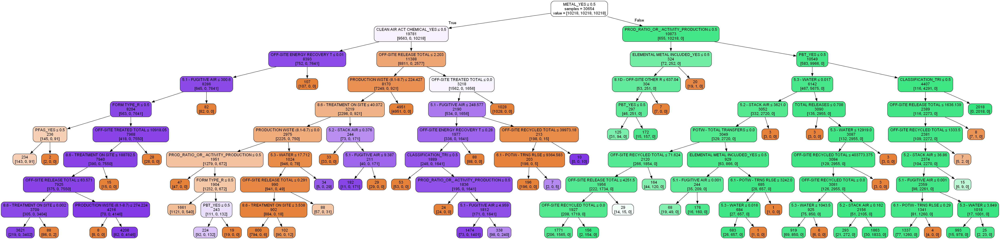

In [76]:
from dmba import plotDecisionTree, classificationSummary
import graphviz

smallClassTree = DecisionTreeClassifier(max_depth=9, min_samples_split=190, min_impurity_decrease=0)
smallClassTree.fit(X_train_resampled, y_train_resampled)

plotDecisionTree(smallClassTree, feature_names=X_train_resampled.columns)

In [77]:
from sklearn.tree import export_graphviz
from IPython.display import Image
import pydotplus

# Assuming you want to visualize the first tree in the forest
tree_to_visualize = rf_classifier.estimators_[0]

# Export the decision tree to a DOT file
dot_data = export_graphviz(tree_to_visualize, 
                           out_file=None, 
                           feature_names=list(X_train_resampled.columns),  # Replace with your feature names
                           class_names=['Class 0', 'Class 1','Class 2','Class 3','Class 4'],  # Replace with your class names
                           filled=True, rounded=True, special_characters=True)

# Create a graph from the DOT data
graph = pydotplus.graph_from_dot_data(dot_data)

# Display the decision tree
Image(graph.create_png())

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.842274 to fit



### K-Nearest Neighbors Model

In [78]:
from sklearn.model_selection import GridSearchCV
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score

# Create a KNN classifier
knn_classifier = KNeighborsClassifier()

# Define the hyperparameter grid to search
param_grid = {
    'n_neighbors': [4, 5, 6],  # you can expand this range
    'weights': ['distance'],
    'p': [1]  # 1 for Manhattan distance, 2 for Euclidean distance
}

# Create the GridSearchCV object
grid_search = GridSearchCV(estimator=knn_classifier, param_grid=param_grid, cv=5, scoring='accuracy', n_jobs=-1)

# Fit the model to the training data
grid_search.fit(X_train_resampled, y_train_resampled)

# Print the best hyperparameters
print("Best Hyperparameters:", grid_search.best_params_)

# Get the best model
best_knn_model = grid_search.best_estimator_

y_pred = best_knn_model.predict(X_test)

# Calculate accuracy
accuracy = accuracy_score(y_test, y_pred)
print("Test Accuracy:", accuracy)


Best Hyperparameters: {'n_neighbors': 4, 'p': 1, 'weights': 'distance'}
Test Accuracy: 0.9012310334955626


### t-distributed Stochastic Neighbor Embedding

##### Plot for KNN model

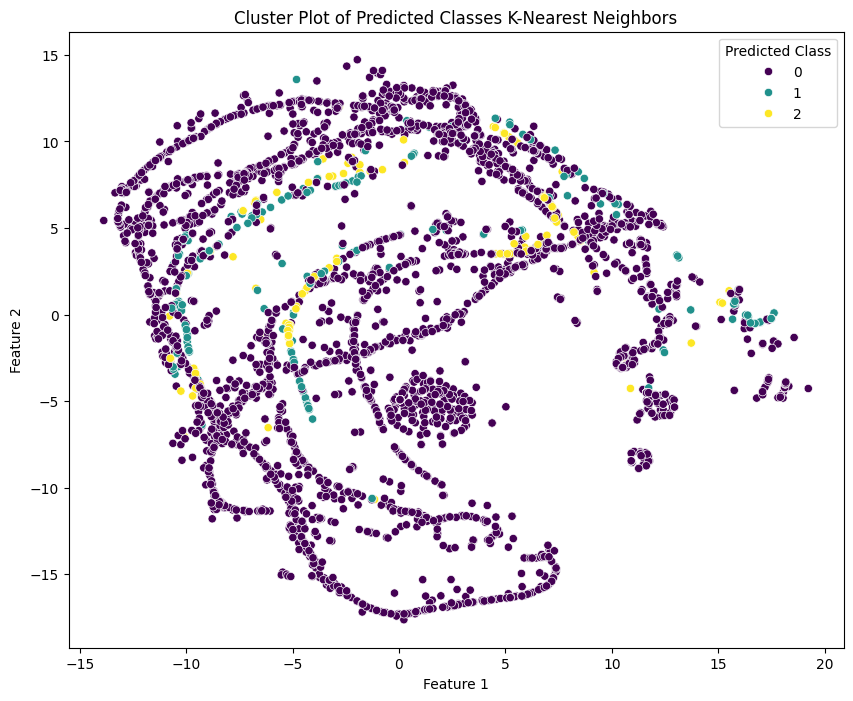

In [79]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.manifold import TSNE

# Use t-SNE for dimensionality reduction to visualize clusters
tsne = TSNE(n_components=3, perplexity= 45, learning_rate='auto', n_iter=1000, random_state=42, init='random', metric='manhattan')
X_test_tsne = tsne.fit_transform(X_test)

# Predictions on the test data
y_pred = best_knn_model.predict(X_test)

# Create a DataFrame for visualization
df = pd.DataFrame(data={'Feature 1': X_test_tsne[:, 0], 'Feature 2': X_test_tsne[:, 1], 'Predicted Class': y_pred})

# Plot the clusters
plt.figure(figsize=(10, 8))
sns.scatterplot(x='Feature 1', y='Feature 2', hue='Predicted Class', data=df, palette='viridis', legend='full')
plt.title('Cluster Plot of Predicted Classes K-Nearest Neighbors')
plt.show()

##### Plot for Random Forest

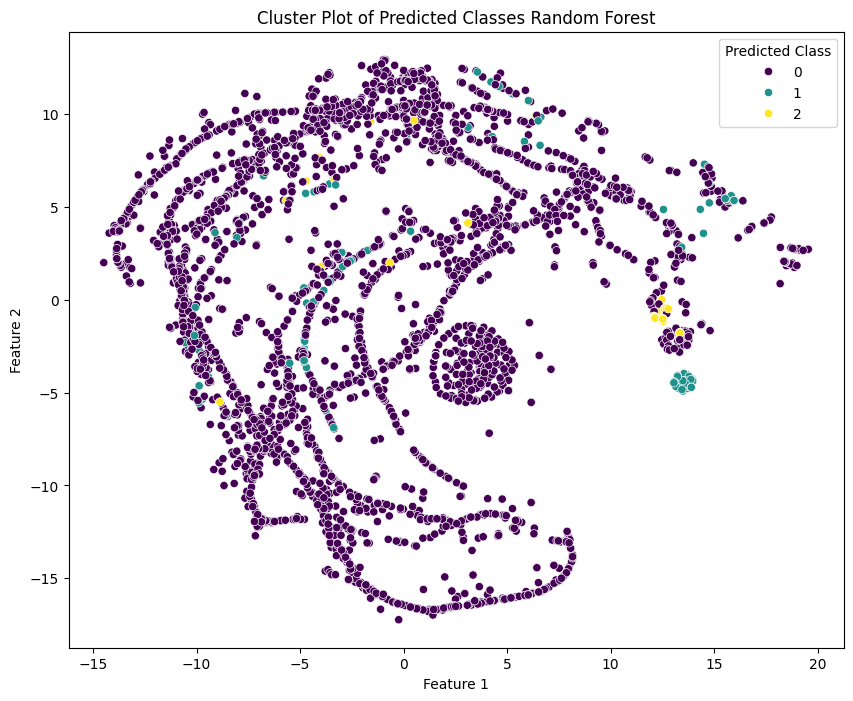

In [80]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.manifold import TSNE

# Use t-SNE for dimensionality reduction to visualize clusters
tsne = TSNE(n_components=3, perplexity= 50, learning_rate='auto', n_iter=1000, random_state=42, init='random', metric='manhattan')
X_test_tsne = tsne.fit_transform(X_test)

# Predictions on the test data
y_pred = best_rf_model.predict(X_test)

# Create a DataFrame for visualization
df = pd.DataFrame(data={'Feature 1': X_test_tsne[:, 0], 'Feature 2': X_test_tsne[:, 1], 'Predicted Class': y_pred})

# Plot the clusters
plt.figure(figsize=(10, 8))
sns.scatterplot(x='Feature 1', y='Feature 2', hue='Predicted Class', data=df, palette='viridis', legend='full')
plt.title('Cluster Plot of Predicted Classes Random Forest')
plt.show()